# Evaluation

First a confusion matrix will be created to then look with grad-cam at the attention of the model

## Importing libraries

In [23]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import pandas as pd
from keras.models import load_model
import random
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

SEED=42

print('TensorFlow version:', tf.__version__)

TensorFlow version: 2.10.1


# Loading models and data

In [24]:
test_df = pd.read_pickle('../model/iteration_0/test_df.pkl')
print("test data loaded succesfully")

model_path = "../model/iteration_0/cnn_model.h5"
model = load_model(model_path)
print("Model loaded successfully")

test data loaded succesfully
Model loaded successfully


In [25]:
test_df.sample(n=3, random_state=SEED)

,id,image_path,type_landscape,type_mythological,type_portrait,type_religious,label,label_name
294,13340,../data/toy_dataset/13340.jpg,False,False,True,False,2,portrait
454,23395,../data/toy_dataset/23395.jpg,True,False,False,False,0,landscape
584,6767,../data/toy_dataset/6767.jpg,True,False,False,False,0,landscape


The data is correctly loaded, now the model will be loaded

In [26]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 xception (Functional)       (None, 10, 10, 2048)      20861480  
                                                                 
 global_average_pooling2d_2   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_2 (Dropout)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 4)                 8196      
                                                                 
Total params: 20,869,676
Trainable params: 8,196
Non-trainable params: 20,861,480
___________________________________________

## Function to preprocess images

In [27]:
IMG_SIZE = (299, 299)

def parse_image(filename):
    image = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, IMG_SIZE)
    image = keras.applications.xception.preprocess_input(image)
    return image

# Confusion Matrix

In [28]:
image_paths = test_df['image_path'].values
true_labels = test_df['label'].values

# Preprocess all images into a numpy array
images = np.stack([parse_image(path).numpy() for path in image_paths])

In [29]:
# Predict probabilities for each class
pred_probs = model.predict(images, batch_size=32)
# Convert probabilities to class indices
pred_labels = np.argmax(pred_probs, axis=1)

3/3 [==============================] - 1s 341ms/step


<Figure size 600x600 with 0 Axes>

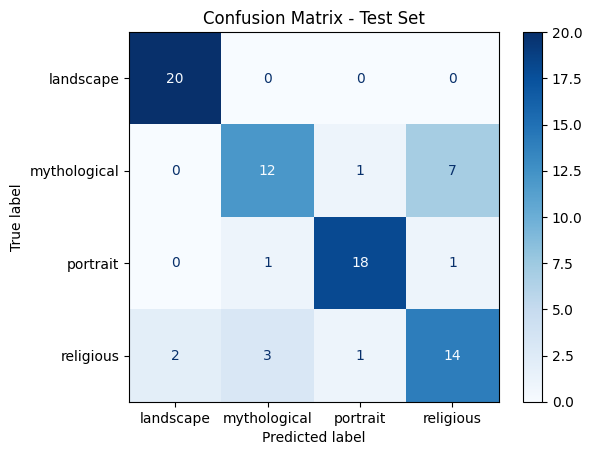

In [30]:
label_order = sorted(test_df[['label', 'label_name']].drop_duplicates().values.tolist())
class_names = [name for idx, name in sorted(label_order, key=lambda x: x[0])]

cm = confusion_matrix(true_labels, pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(6,6))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix - Test Set')
plt.show()

The model demonstrates strong performance on `landscape` and `portrait` artworks, with nearly perfect classification. There is substantial overlap and confusion between `mythological` and `religious` categories, suggesting that either the visual distinctions are subtle or the current features are not sufficient to clearly separate these classes. Further investigation such as analysis of misclassified images or additional specific features may be required to improve performance on these challenging categories

Now the misclassified images will be inspected

In [31]:
misclassified_indices = np.where(pred_labels != true_labels)[0]

misclassified_df = test_df.iloc[misclassified_indices].copy()
misclassified_df['pred_label'] = pred_labels[misclassified_indices]
misclassified_df['pred_label_name'] = [class_names[i] for i in misclassified_df['pred_label']]

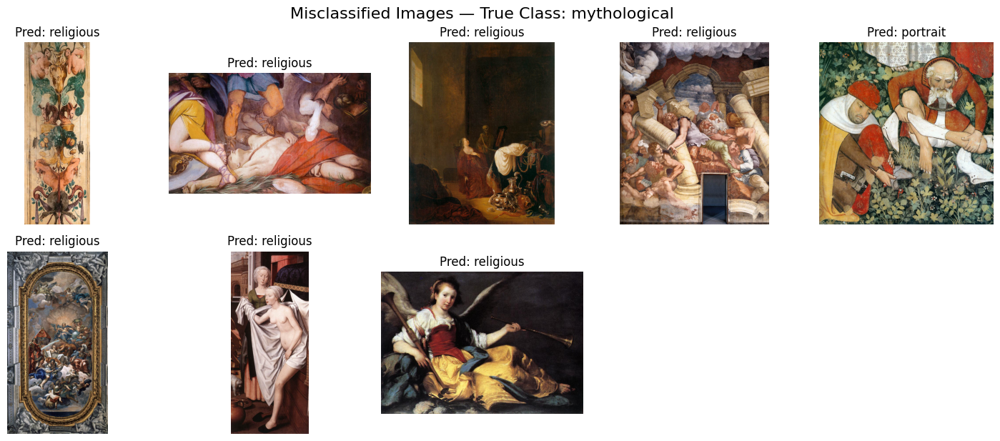

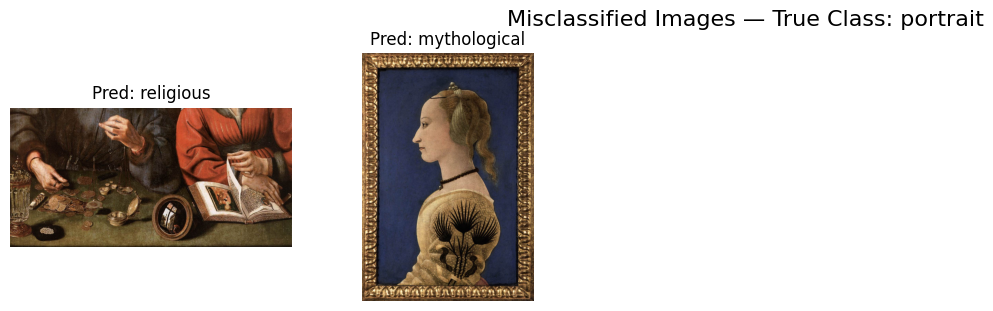

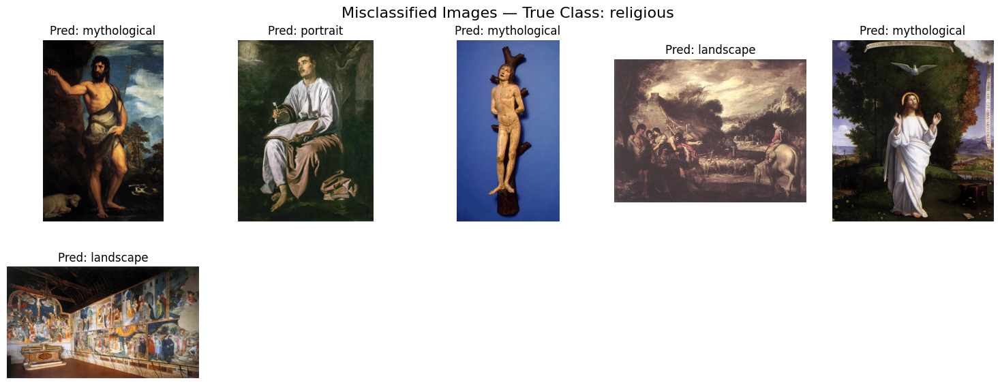

In [32]:
grouped = misclassified_df.groupby('label_name')

for true_class, group in grouped:
    n_images = len(group)
    n_cols = 5
    n_rows = int(np.ceil(n_images / n_cols))
    
    plt.figure(figsize=(n_cols*3, n_rows*3))
    for i, (idx, row) in enumerate(group.iterrows()):
        img = mpimg.imread(row['image_path'])
        plt.subplot(n_rows, n_cols, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Pred: {row['pred_label_name']}")
    
    plt.tight_layout()
    plt.suptitle(f"Misclassified Images — True Class: {true_class}", y=1.02, fontsize=16)
    plt.show()

The visual inspection of misclassified images grouped by true class provides valuable insight into the strengths and limitations of the model and overlap between classes:

**Mythological Class**
Most misclassified mythological artworks are predicted as religious. Many images contain religious complex compositions or figures that could fit both mythological and religious contexts. This highlights substantial visual and thematic overlap between these two categories making them particularly difficult for the model to distinguish. Only a single mythological image was misclassified as portrait indicating the model rarely confuses mythological with portrait.

**Portrait Class**
Misclassifications for portraits are limited. The two errors occur when religious or mythological themes are present in a portrait like format. Important note is that first tought would be that the model look at faces it does not appears so in the first image shown. This suggests that the model may rely on contextual cues as much as facial features. Overall the model distinguishes portraits well but can be misled by atypical content.

**Religious Class**
Religious images are misclassified as mythological, portrait, or landscape. Most notably several religious artworks are incorrectly predicted as mythological again underscoring the visual similarity between these two classes. In some cases the model also confuses scenery religious art with the landscapes class.

**Landscape Class**
Landscape does not have a plot of its own due to no mistakes being made within the true prediction.

**Overall Patterns and Implications**
The primary challenge for the model lies in separating religious and mythological artworks. This is driven by visual ambiguity not just model limitations. Portraits and landscapes are generally classified with high reliability but edge cases exist where visual cues override the main subject.

These results indicate that future improvements could focus on enriching the dataset with more examples that clarify the boundaries between mythological and religious themes, or on integrating metadata or textual descriptions to assist the visual model in disambiguity

## Classification report
As a quantitative summary

In [33]:
from sklearn.metrics import classification_report
print(classification_report(true_labels, pred_labels, target_names=class_names))

              precision    recall  f1-score   support

   landscape       0.91      1.00      0.95        20
mythological       0.75      0.60      0.67        20
    portrait       0.90      0.90      0.90        20
   religious       0.64      0.70      0.67        20

    accuracy                           0.80        80
   macro avg       0.80      0.80      0.80        80
weighted avg       0.80      0.80      0.80        80



# Grad-Cam

The first step is the get the correct layer

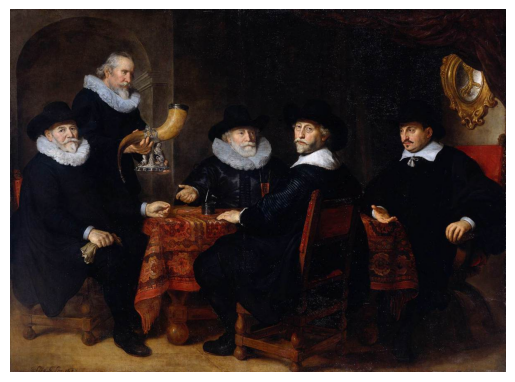

In [34]:
from IPython.display import display
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

model_builder = keras.applications.xception.Xception
img_size = (299, 299)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions


row = test_df.sample(1, random_state=SEED).iloc[0]
img_path = row['image_path']
label = row['label']
label_name = row['label_name']

img = mpimg.imread(img_path)
plt.imshow(img)
plt.axis('off')
plt.show()

In [35]:
from keras import Model
# 1) Identify the pooling layer in your trained model:
pooling_layer = model.get_layer("global_average_pooling2d_2")
#    └── its input tensor is the 10×10×2048 conv-feature-map you want.

# 2) Build a new “grad-model” that returns both
#      a) that conv-map, and
#      b) your final predictions
grad_model = Model(
    inputs = model.inputs,
    outputs = [ pooling_layer.input, model.output ]
)

In [36]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, grad_model, pred_index=None):
    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

1/1 [==============================] - 0s 62ms/step
Predicted class index: 2  (confidence 0.869)


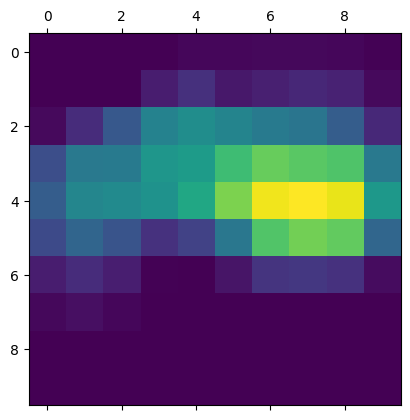

In [37]:
img_array = preprocess_input(get_img_array(img_path, size=img_size))

preds = model.predict(img_array)
probs = preds[0]
top_index = np.argmax(probs)
top_confidence = probs[top_index]

print(f"Predicted class index: {top_index}  (confidence {top_confidence:.3f})")

heatmap = make_gradcam_heatmap(img_array, grad_model)

plt.matshow(heatmap)
plt.show()

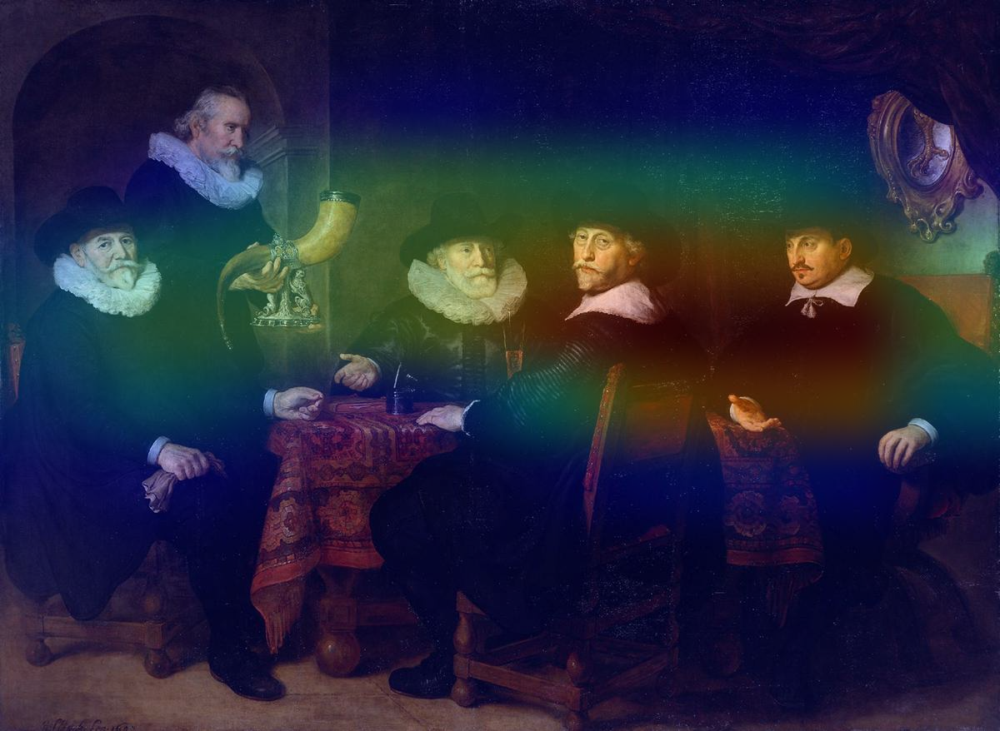

1/1 [==============================] - 0s 31ms/step
Predicted class index: 2  (confidence 0.869)
Predicted class name: portrait
True class name: portrait


In [38]:
def display_gradcam(img_path, heatmap, alpha=0.4):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = mpl.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)


    # Display Grad CAM
    display(superimposed_img)


display_gradcam(img_path, heatmap)

pairs = test_df[['label', 'label_name']].drop_duplicates(subset='label')
label_map = pairs.set_index('label')['label_name'].to_dict()

def class_prediction(img_array, label_map, label_name):
    preds = model.predict(img_array)
    probs = preds[0]

    top_index = np.argmax(probs)
    top_confidence = probs[top_index]

    print(f"Predicted class index: {top_index}  (confidence {top_confidence:.3f})")


    print("Predicted class name:", label_map[top_index])
    print("True class name:", label_name)

class_prediction(img_array, label_map, label_name)

Here it shows clearly that the model focuses on the faces and with this predict the class is portrait

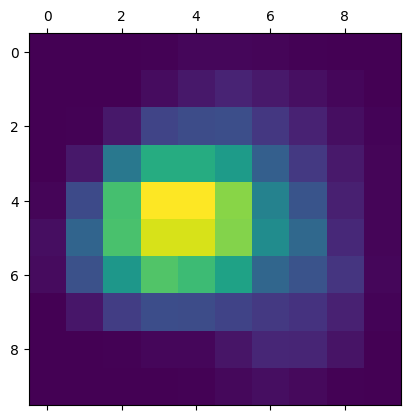

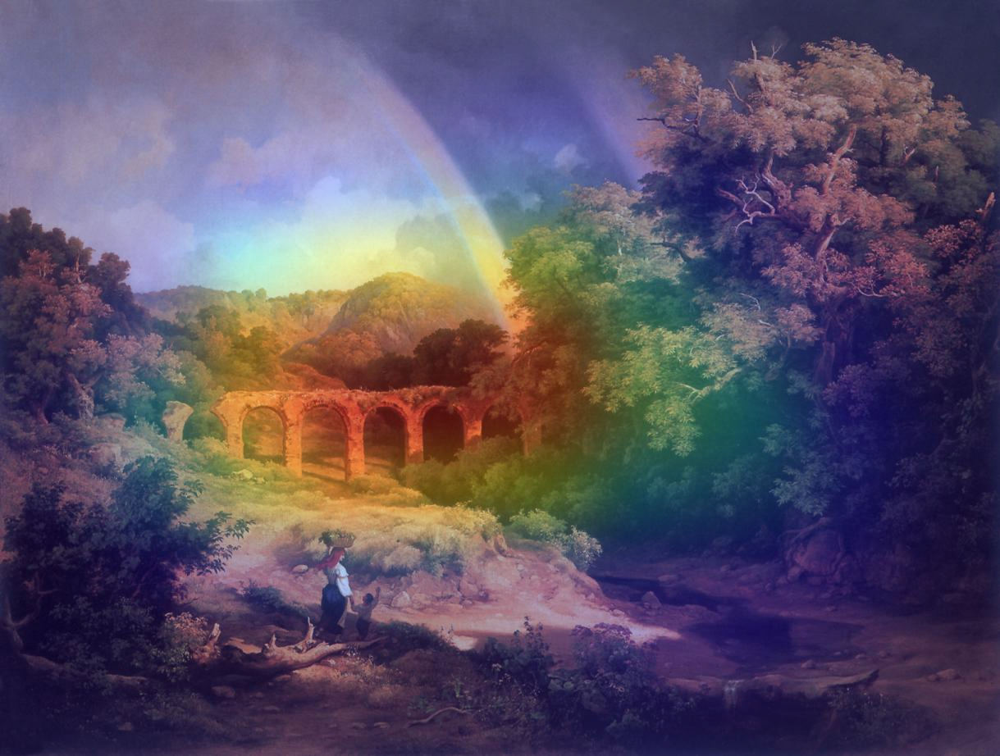

1/1 [==============================] - 0s 24ms/step
Predicted class index: 0  (confidence 0.882)
Predicted class name: landscape
True class name: landscape


In [39]:
row = test_df.sample(2, random_state=SEED).iloc[1]
img_path = row['image_path']
label = row['label']
label_name = row['label_name']

img_array = preprocess_input(get_img_array(img_path, size=img_size))

heatmap = make_gradcam_heatmap(img_array, grad_model)

plt.matshow(heatmap)
plt.show()

display_gradcam(img_path, heatmap)
class_prediction(img_array, label_map, label_name)

It is visible that the model is looking in the distance to classify it correctly as a landscape

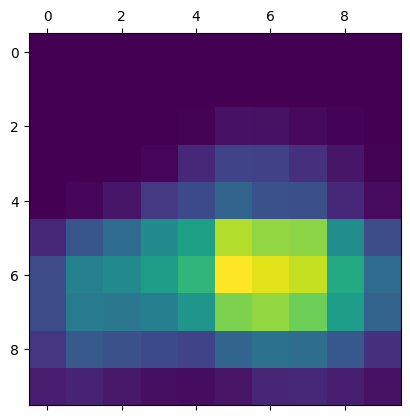

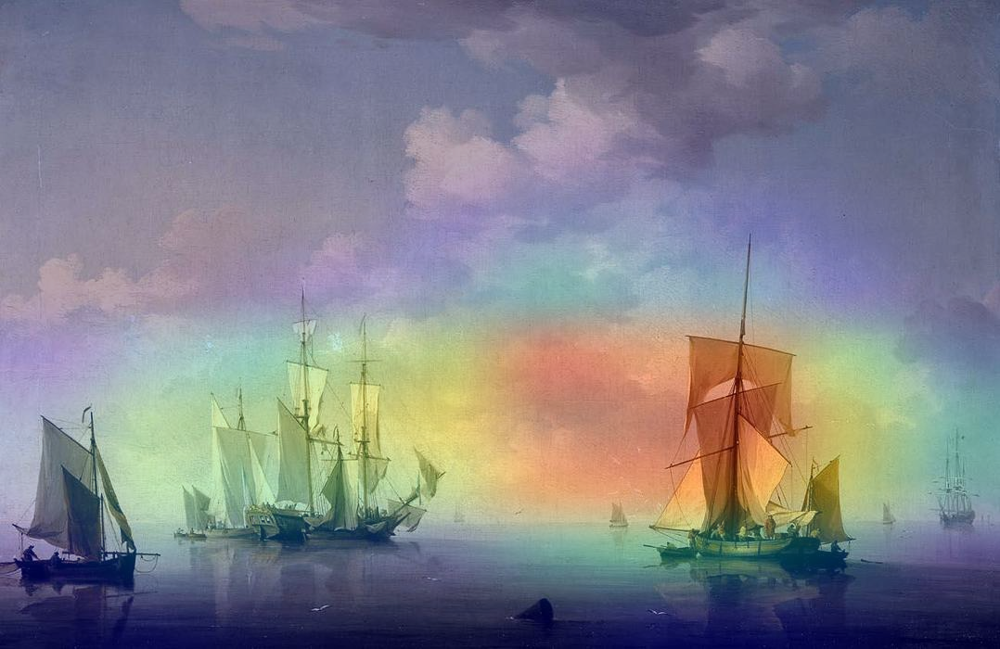

1/1 [==============================] - 0s 22ms/step
Predicted class index: 0  (confidence 0.848)
Predicted class name: landscape
True class name: landscape


In [40]:
row = test_df.sample(7, random_state=SEED).iloc[6]
img_path = row['image_path']
label = row['label']
label_name = row['label_name']

img_array = preprocess_input(get_img_array(img_path, size=img_size))

heatmap = make_gradcam_heatmap(img_array, grad_model)

plt.matshow(heatmap)
plt.show()

display_gradcam(img_path, heatmap)
class_prediction(img_array, label_map, label_name)

Again it is visible that the model is looking in the distance

## Next steps
Based on the confusion matrix, misclassified image grids and Grad-CAM visualizations the evaluation shows that the model reliably distinguishes portraits and landscapes but struggles to differentiate between mythological and religious paintings. In the next iteration, plotting a calibration plot will help assess how well the models predicted probabilities correspond to actual outcomes. Additionally plotting ROC curves will provide insight into the models ability to rank each class and its overall discriminative performance